# GASTON-Consensus: domains as consensus changes in gene behavior

This notebook develops an alternative to GASTON-Mix's scalar **isodepth bottleneck**. The gate still defines one shared spatial partition,

\[
\widehat{\mathbf y}_i=\sum_{p=1}^{P}G_p(\mathbf s_i)E_p(\mathbf s_i),
\]

but each expert can independently model every gene with constant, linear, sigmoidal, exponential-decay, or sinusoidal behavior.

The biological hypothesis is deliberately narrow: **genes do not need to share a gradient inside a domain; they only share a sparse set of domain boundaries.** A valid boundary is therefore supported by coordinated behavior changes in a non-trivial fraction of genes, while many genes are allowed to remain unchanged.

This is a research prototype, not yet a drop-in replacement for the package training CLI.

## Why this architecture

Three plausible expert designs were considered:

1. **One unconstrained neural field per domain and gene.** Maximum flexibility, but boundaries become non-identifiable: a neural field can create an internal discontinuity or oscillation instead of asking the gate for a boundary. It is also severely over-parameterized for sparse spatial counts.
2. **A fully fixed basis with one free coefficient vector per gene.** Interpretable and identifiable, but still permits as many unrelated profiles as genes.
3. **A fixed multiscale basis plus low-rank gene coefficients (chosen).** It spans the requested function classes, keeps coefficients comparable between domains, and limits each domain to a small number of profile archetypes. Every gene nevertheless has its own mixture.

The gate is a soft spatial neural network during training. Temperature annealing makes it nearly discrete at the end. This is preferable to top-1 normalization during training: with one selected expert its normalized weight is exactly one, so the gate receives little or no useful reconstruction gradient. Hard labels are only taken after fitting.

The basis is fixed rather than learned because an exponential in one domain must mean the same thing as an exponential in another domain if coefficient differences are to quantify a behavior change.

In [1]:
from pathlib import Path
import sys

import matplotlib.pyplot as plt
import numpy as np
import torch
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# Make the root utility module importable when the notebook is launched elsewhere.
ROOT = Path.cwd()
if not (ROOT / "gaston_improvement_support.py").exists():
    ROOT = ROOT.parents[2]
sys.path.insert(0, str(ROOT))

from gaston_improvement_support import (
    BasisConfig,
    ConsensusSpatialMoE,
    LossWeights,
    align_labels,
    axis_pair_error,
    compact_basis_config,
    fit_consensus_moe,
    graph_expression_initialization,
    init_learned_axes_from_coords,
    initialize_experts_from_ridge,
    load_merfish_slice,
    make_continuous_tiled_toy_data,
    make_oriented_axis_toy,
    make_random_continuous_checkerboard,
    pretrain_gate,
    set_seed,
    spatial_gene_pca,
    spatial_knn_edges,
    tilewise_expression_initialization,
)

set_seed(7)
torch.set_default_dtype(torch.float32)


/home/asalmona/miniconda3/envs/gaston-mix/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Expert definition

Normalize coordinates to \([-1,1]^2\). Define a shared dictionary

\[
\Phi(\mathbf s)=\left[1, x,y,\;\sigma\{k(\mathbf d^\top\mathbf s-c)\},\;e^{-\lambda\,\mathrm{softplus}(\mathbf d^\top\mathbf s)},\;\sin(\pi f\mathbf d^\top\mathbf s),\cos(\pi f\mathbf d^\top\mathbf s)\right].
\]

Directions \(\mathbf d\) cover horizontal, vertical, and two diagonals; several offsets, scales, decay rates and frequencies make the dictionary multiscale. Sine/cosine pairs permit arbitrary phase. A linear combination can represent a constant, linear trend, smooth switch, monotone decay, oscillation, or combinations of these.

For domain \(p\), gene \(g\), and non-constant basis index \(b\),

\[
E_{pg}(\mathbf s)=\beta_{pg}+\sum_b\theta_{pgb}\Phi_b(\mathbf s),\qquad
\theta_{pgb}=\sum_{r=1}^{R}U_{pgr}V_{prb}.
\]

The rank \(R\ll\min(G,B)\) bounds the number of behavior archetypes in a domain. The loading vector \(U_{pg:}\) remains gene-specific, so genes are not forced to have identical curves. Standardizing basis columns is important: otherwise coefficient sparsity would favor basis functions merely because they have larger numerical scale.

A later section replaces this overcomplete dictionary by a compact one (constant, linear, sigmoid, exponential decay; no Fourier, no diagonals) evaluated in a **learned orthonormal frame** shared by every expert. Slice orientation is not known a priori; the two tissue axes are.


## Objective: fit counts, prefer simple profiles, and require boundary evidence

For real UMI counts, the reconstruction term should be a **negative-binomial likelihood** with spot library size as an offset and gene-specific dispersion. Gaussian MSE is used below only because the toy data are continuous.

The implemented objective is

\[
\mathcal L=\mathcal L_{\mathrm{data}}+\lambda_{TV}\mathcal L_{TV}+\lambda_H\mathcal L_H+\lambda_B\mathcal L_{balance}+\lambda_R\|\Theta\|_2^2+\lambda_F\mathcal L_{family}+\lambda_{fuse}\mathcal L_{fuse}+\lambda_C\mathcal L_{consensus}.
\]

- **Spatial boundary/TV:** on neighboring spots \((i,j)\), \(b_{ij}=1-\sum_pG_{ip}G_{jp}\). Minimizing its mean avoids fragmented domains and unnecessary boundaries.
- **Gate entropy:** annealing plus low entropy yields crisp assignments. A weak usage penalty prevents expert collapse; it should stay weak because biological domains need not have equal area.
- **Profile complexity:** ridge stabilizes coefficients; group lasso acts on entire function families, discouraging a gene from simultaneously using every sigmoid, exponential and frequency.
- **Fused genes:** for domain pairs that actually touch, an L1 penalty on \(\theta_{pg:}-\theta_{qg:}\) and \(\beta_{pg}-\beta_{qg}\) makes many genes exactly or nearly unchanged.
- **Boundary consensus:** at each active boundary, cross-evaluate both experts at the edge midpoint. A gene supports the boundary when its standardized jump exceeds a threshold. A hinge loss requires at least a chosen fraction of genes to support it. Thus one noisy marker cannot create a domain, but not all genes are forced to change.

This combination resolves an otherwise contradictory goal: fusion says *most genes may remain stable*, while the consensus hinge says *enough genes must change strongly to justify every boundary*. Reconstruction decides which genes change.

For many genes, replace the raw fraction by pathway-aware or cell-type-aware weights so a single abundant lineage program does not dominate boundary evidence.

## Harder stress tests: continuous fields inside 16 tiles

The tissue is now divided into a **4 × 4 mosaic of square tiles**, with a 4 × 4 grid of observations inside every tile (256 spots total). Expression varies continuously within every tile; tile color only determines which continuous expert generated each spot.

Two non-convex layouts are tested:

1. **Checkerboard:** alternating tiles belong to domain 0 or 1. Each domain therefore has eight disconnected components.
2. **Random three-domain mosaic:** each of the 16 tiles is assigned one of three domains using a fixed random draw.

The four genes use different domain-specific combinations of linear, sinusoidal, exponential-decay and sigmoid functions. Some domain pairs share a gene function exactly; other genes change slope, family, orientation, or baseline. Thus no boundary requires every gene to change.

These examples are harder for the gate than ordinary anatomical layers: spatial smoothness alone prefers the wrong solution because the true map contains many boundaries.

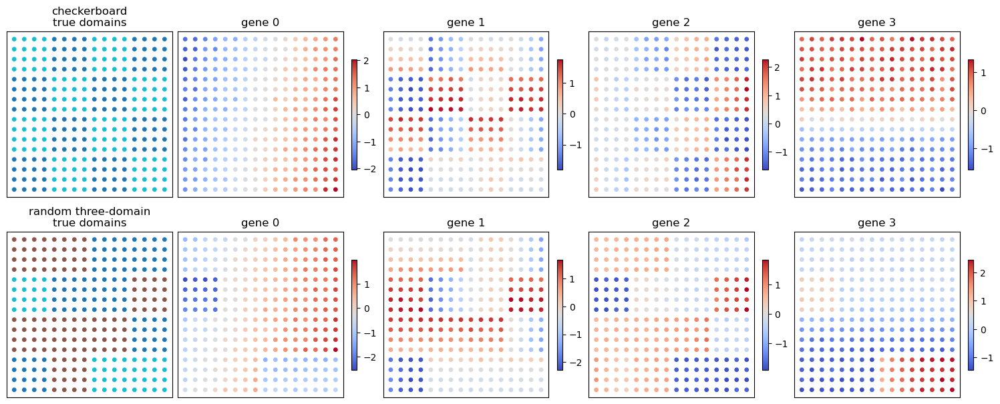

In [4]:
toy_data = {
    "checkerboard": make_continuous_tiled_toy_data(
        "checkerboard", points_per_tile=4, noise_sd=0.05, seed=7
    ),
    "random three-domain": make_continuous_tiled_toy_data(
        "random_three", points_per_tile=4, noise_sd=0.05, seed=5
    ),
}

fig, axes = plt.subplots(2, 5, figsize=(15, 6), constrained_layout=True)
for row, (name, (coords, expression, domains, tile_layout)) in enumerate(toy_data.items()):
    axes[row, 0].scatter(coords[:, 0], coords[:, 1], c=domains, cmap="tab10", s=15)
    axes[row, 0].set_title(f"{name}\ntrue domains")
    for gene in range(4):
        points = axes[row, gene + 1].scatter(
            coords[:, 0], coords[:, 1], c=expression[:, gene],
            cmap="coolwarm", s=15
        )
        axes[row, gene + 1].set_title(f"gene {gene}")
        fig.colorbar(points, ax=axes[row, gene + 1], shrink=0.65)
for ax in axes.flat:
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

### What had to improve for disconnected domains

A raw-coordinate gate and spatial k-means are inappropriate here: both strongly favor connected regions. Three targeted changes make the stress test learnable without changing the MoE equation:

- **Multiscale Fourier features only in the gate** let a compact network represent repeated and non-convex tile assignments. The expression basis remains low frequency, preventing experts from hiding boundaries as arbitrary high-frequency expression fields.
- **Behavior-aware initialization** clusters tile-average expression rather than coordinates. For alternating patterns, a smooth global field can first be regressed out so broad gradients do not dominate the clustering. Hidden true labels are never passed to training.
- **Staged optimization** initially freezes the well-initialized gate while experts learn their continuous functions, then unfreezes it with a learning rate 30 times lower than the expert rate. Joint training from epoch zero caused the gate to destroy correct boundaries before the experts had learned useful curves.

This is not a trick specific to squares: in real data, tiles correspond to histological superpixels or local neighborhoods. Multiple initializations and spatially blocked validation are still required.

In [5]:
def fit_tiled_toy(name, data, n_domains, seed, residualize=False):
    coords, expression, true_domains, tile_layout = data
    set_seed(seed)
    initial_domains = tilewise_expression_initialization(
        expression,
        tiles_per_axis=4,
        points_per_tile=4,
        n_domains=n_domains,
        seed=seed,
        coords=coords,
        residualize_global_trends=residualize,
    )
    model = ConsensusSpatialMoE(
        n_genes=4,
        n_domains=n_domains,
        rank=3,
        gate_hidden=(80, 80),
        gate_fourier_frequencies=(1, 2, 3, 4),
        basis_config=BasisConfig(frequencies=(0.5, 1.0)),
    )
    pretrain_gate(model, coords, initial_domains, steps=500, learning_rate=1e-2)
    weights = LossWeights(
        spatial_boundary=0.004,  # weak: these layouts genuinely have many boundaries
        gate_entropy=0.004,
        gate_balance=0.015,
        coefficient_ridge=5e-4,
        basis_group_lasso=3e-3,
        fused_genes=2e-3,
        boundary_consensus=0.05,
    )
    history = fit_consensus_moe(
        model,
        coords,
        expression,
        epochs=700,
        learning_rate=6e-3,
        gate_learning_rate=2e-4,
        freeze_gate_epochs=500,
        weights=weights,
        likelihood="gaussian",
        start_temperature=0.8,
        end_temperature=0.15,
        print_every=25,
    )
    with torch.no_grad():
        prediction, gates, experts = model(coords)
        predicted_domains = model.hard_domains(coords).cpu().numpy()
    result = {
        "name": name,
        "data": data,
        "model": model,
        "history": history,
        "initial_domains": initial_domains.cpu().numpy(),
        "predicted_domains": predicted_domains,
        "prediction": prediction,
        "experts": experts,
        "initial_ari": adjusted_rand_score(true_domains.numpy(), initial_domains.numpy()),
        "final_ari": adjusted_rand_score(true_domains.numpy(), predicted_domains),
        "mse": torch.mean((prediction - expression) ** 2).item(),
    }
    return result

results = [
    fit_tiled_toy("checkerboard", toy_data["checkerboard"], 2, seed=7,
                  residualize=True),
    fit_tiled_toy("random three-domain", toy_data["random three-domain"], 3,
                  seed=5),
]

for result in results:
    print(f"{result['name']:20s} | init ARI={result['initial_ari']:.3f} "
          f"| final ARI={result['final_ari']:.3f} | MSE={result['mse']:.4f}")

checkerboard         | init ARI=1.000 | final ARI=1.000 | MSE=0.0158
random three-domain  | init ARI=1.000 | final ARI=1.000 | MSE=0.0077


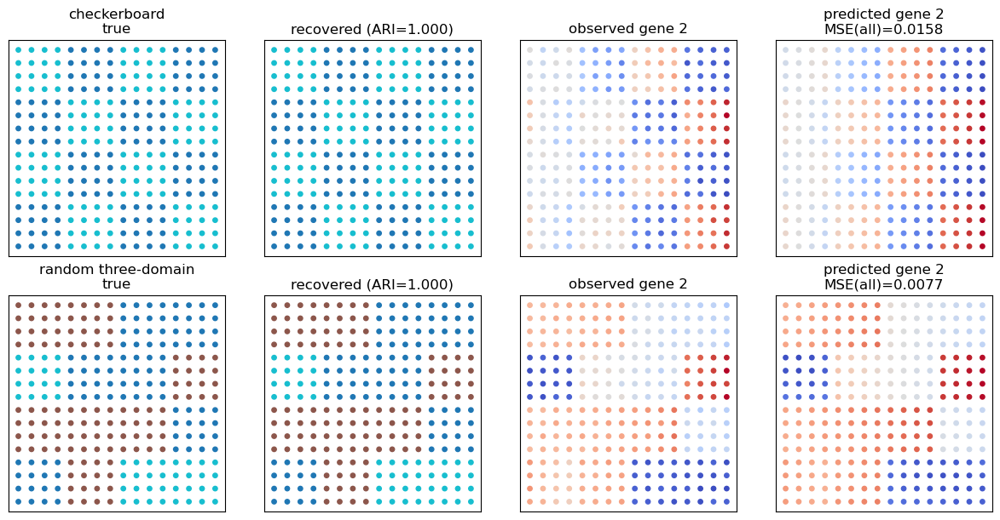

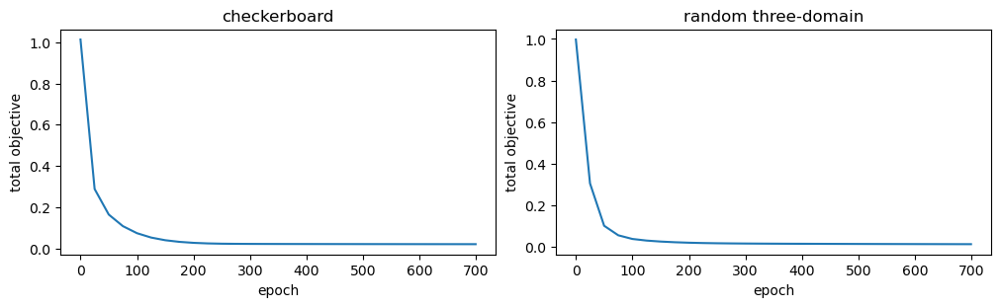

In [6]:
fig, axes = plt.subplots(2, 4, figsize=(12, 6), constrained_layout=True)
for row, result in enumerate(results):
    coords, expression, true_domains, _ = result["data"]
    aligned = align_labels(result["predicted_domains"], true_domains.numpy())
    axes[row, 0].scatter(coords[:, 0], coords[:, 1], c=true_domains, cmap="tab10", s=15)
    axes[row, 0].set_title(f"{result['name']}\ntrue")
    axes[row, 1].scatter(coords[:, 0], coords[:, 1], c=aligned, cmap="tab10", s=15)
    axes[row, 1].set_title(f"recovered (ARI={result['final_ari']:.3f})")
    axes[row, 2].scatter(
        coords[:, 0], coords[:, 1], c=expression[:, 2], cmap="coolwarm", s=15
    )
    axes[row, 2].set_title("observed gene 2")
    axes[row, 3].scatter(
        coords[:, 0], coords[:, 1], c=result["prediction"][:, 2],
        cmap="coolwarm", s=15
    )
    axes[row, 3].set_title(f"predicted gene 2\nMSE(all)={result['mse']:.4f}")
for ax in axes.flat:
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(10, 3), constrained_layout=True)
for ax, result in zip(axes, results):
    ax.plot([row["epoch"] for row in result["history"]],
            [row["total"] for row in result["history"]])
    ax.set(title=result["name"], xlabel="epoch", ylabel="total objective")
plt.show()

### Did genes share boundaries without sharing one gradient?

The random mosaic is the stronger diagnostic because all three expert pairs occur repeatedly. The first summary shows the magnitude assigned to each requested function family per gene. The second cross-evaluates expert pairs at all coordinates and reports standardized gene changes.

A useful result is heterogeneous: several behavior families should be active, and each domain pair should have both strongly changing and relatively stable genes. If all genes change equally, fusion is too weak; if only one gene changes, consensus support is too weak.

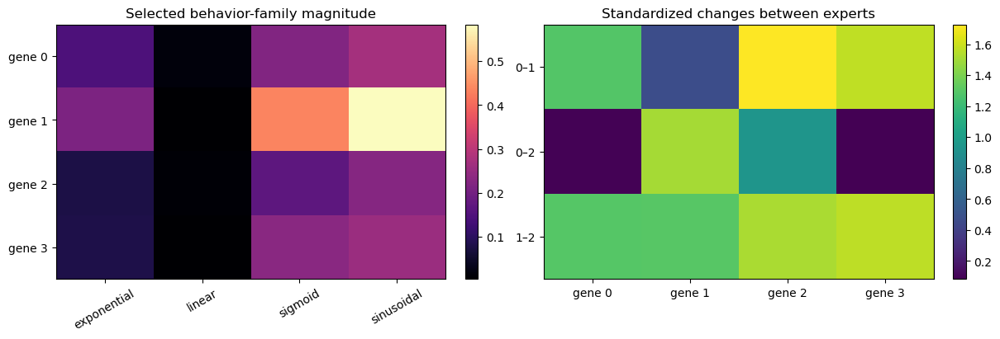

In [7]:
diagnostic = results[1]
model = diagnostic["model"]
coords, expression, _, _ = diagnostic["data"]
all_experts = diagnostic["experts"]
with torch.no_grad():
    coefficients = model.coefficients().abs()
    families = np.array(model.basis.families[1:])
    family_names = sorted(set(families))
    family_strength = torch.stack(
        [coefficients[:, :, families == family].square().sum(-1).sqrt().mean(0)
         for family in family_names], dim=1
    ).cpu().numpy()
    gene_scale = expression.std(0, unbiased=False).clamp_min(0.1)
    pair_names, pair_changes = [], []
    for p in range(model.n_domains):
        for q in range(p + 1, model.n_domains):
            change = (all_experts[:, p] - all_experts[:, q]).abs().mean(0) / gene_scale
            pair_names.append(f"{p}–{q}")
            pair_changes.append(change)
    pair_changes = torch.stack(pair_changes).cpu().numpy()

fig, axes = plt.subplots(1, 2, figsize=(12, 4), constrained_layout=True)
image = axes[0].imshow(family_strength, aspect="auto", cmap="magma")
axes[0].set(xticks=range(len(family_names)), xticklabels=family_names,
            yticks=range(4), yticklabels=[f"gene {g}" for g in range(4)],
            title="Selected behavior-family magnitude")
axes[0].tick_params(axis="x", rotation=30)
fig.colorbar(image, ax=axes[0])
image = axes[1].imshow(pair_changes, aspect="auto", cmap="viridis")
axes[1].set(xticks=range(4), xticklabels=[f"gene {g}" for g in range(4)],
            yticks=range(len(pair_names)), yticklabels=pair_names,
            title="Standardized changes between experts")
fig.colorbar(image, ax=axes[1])
plt.show()

## Applying this to real spatial transcriptomics

1. **Input and likelihood.** Use raw UMI counts, a spot library-size offset, and the implemented negative-binomial likelihood. Filter very rare genes, but do not z-score counts before the NB model. Highly abundant genes should not automatically carry more boundary votes; consensus uses per-gene standardized changes.
2. **Gene dependence.** Thousands of correlated ribosomal, immune, or cell-cycle genes can create false “consensus.” Compute support over gene programs/pathways, down-weight highly correlated genes, or aggregate genes into decorrelated factors before counting support.
3. **Cell composition versus cell state.** A domain boundary may reflect a changing mixture of cell types rather than within-type regulation. Fit cell-type proportions as covariates, stratify the likelihood by cell type, or analyze pseudobulked cell-type-specific expression when resolution permits.
4. **Geometry.** Replace the radius graph with a histology-aware Delaunay/kNN graph for irregular spots. Penalize boundaries along graph edges, not Euclidean pairs that cross holes, ventricles, or tissue tears.
5. **Initialization.** Run several provisional spatial clusterings and random seeds. Spatial initialization is optimization help, not evidence: final boundaries must improve held-out likelihood and satisfy consensus.
6. **Choosing the number of domains.** Fit a range of \(P\). Select using spatially blocked held-out NB likelihood, boundary stability under spot/gene bootstrap, and a minimum boundary-support criterion—not training loss alone.
7. **Uncertainty.** Bootstrap spots in spatial blocks and genes by programs. Report boundary occurrence probability and gene-specific behavior-change probability rather than only a hard map.

### Essential ablations

- Original scalar-isodepth GASTON-Mix: tests whether extra behavior classes are actually needed.
- Full-rank basis experts: quantifies overfitting prevented by the low-rank profile model.
- No fusion: tests whether every gene spuriously changes at every boundary.
- No consensus hinge: tests whether isolated genes create unsupported domains.
- Unconstrained MLP experts: likely lower training error; compare blocked test likelihood and boundary stability.

A successful model should improve blocked test likelihood and recover stable boundaries while using few profile families. Lower in-sample error by itself is not evidence of a biologically better domain model.

## Fully continuous random sampling: 2,048 spots and six noisy genes

This stress test samples **128 locations independently and uniformly in each of the 16 checkerboard tiles**, giving 2,048 irregularly positioned spots.

Genes 0–3 retain the continuous linear, sinusoidal, exponential and sigmoidal latent functions. Genes 4–5 are spatially constant negative controls—only two constant genes, not four. **All six genes receive independent noise.** At sampled location \(\mathbf s_i\),

\[
\epsilon_{ig}\sim\mathcal N(0,\,0.5\mu_{ig}),\qquad y_{ig}=\mu_{ig}+\epsilon_{ig}.
\]

The noise is therefore centered at zero and its variance for every gene is exactly half that gene's local latent value. The latent means are strictly positive. Gaussian noise may occasionally make an observation negative; that follows from the requested centered noise model. A negative-binomial model is preferable for non-negative UMI counts.

The model receives coordinates and noisy expression only. It does **not** receive tile indices, boundary coordinates, or true domains. A symmetric spatial kNN graph supplies locality without specifying where a boundary lies.

spots: 2,048; genes: 6
standardized noise means: [-0.026 -0.022 -0.039 -0.017  0.011 -0.035]
standardized noise variances: [1.002 1.038 1.031 0.945 1.056 0.966]


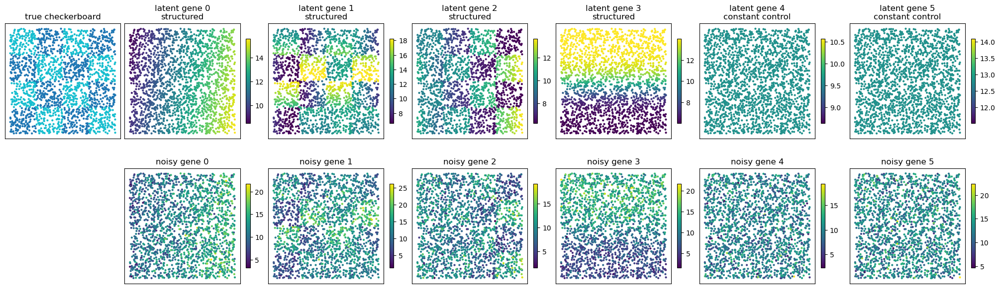

In [8]:
random_coords, noisy_expression, random_domains, latent_mean, noise_variance = (
    make_random_continuous_checkerboard(
        points_per_tile=128,
        noise_variance_ratio=0.5,
        expression_scale=4.0,
        seed=19,
    )
)
standardized_noise = (noisy_expression - latent_mean) / noise_variance.sqrt()
print(f"spots: {len(random_coords):,}; genes: {noisy_expression.shape[1]}")
print("standardized noise means:", standardized_noise.mean(0).numpy().round(3))
print("standardized noise variances:",
      standardized_noise.var(0, unbiased=False).numpy().round(3))

fig, axes = plt.subplots(2, 7, figsize=(20, 6), constrained_layout=True)
axes[0, 0].scatter(random_coords[:, 0], random_coords[:, 1],
                   c=random_domains, cmap="tab10", s=4)
axes[0, 0].set_title("true checkerboard")
axes[1, 0].axis("off")
for gene in range(6):
    clean = axes[0, gene + 1].scatter(
        random_coords[:, 0], random_coords[:, 1], c=latent_mean[:, gene],
        cmap="viridis", s=4
    )
    noisy = axes[1, gene + 1].scatter(
        random_coords[:, 0], random_coords[:, 1], c=noisy_expression[:, gene],
        cmap="viridis", s=4
    )
    kind = "structured" if gene < 4 else "constant control"
    axes[0, gene + 1].set_title(f"latent gene {gene}\n{kind}")
    axes[1, gene + 1].set_title(f"noisy gene {gene}")
    fig.colorbar(clean, ax=axes[0, gene + 1], shrink=0.6)
    fig.colorbar(noisy, ax=axes[1, gene + 1], shrink=0.6)
for ax in axes.flat:
    if ax.axison:
        ax.set_aspect("equal")
        ax.set_xticks([])
        ax.set_yticks([])
plt.show()

### Boundary-blind initialization and optimization

The earlier tile-average initializer leaked the locations of the synthetic tile boundaries and is not used here. The corrected procedure is:

1. regress broad smooth expression trends using coordinates and noisy genes only;
2. average residual expression over a spatial kNN graph;
3. cluster these local expression features to obtain provisional domains;
4. fit a variance-weighted basis regression within each provisional domain;
5. initialize low-rank gene loadings and profile atoms with an SVD;
6. jointly optimize the gate and experts under the consensus objective.

No step sees the true checkerboard, tile IDs, or boundary locations. The kNN graph says only which sampled points are nearby. Consequently this is a genuine domain-discovery test and is harder than the tile-aware result.

The two constant noisy controls cannot support a boundary. Fusion should keep them similar between experts, while genes with changed functional behavior provide the boundary evidence. The known variance is available only because this is a simulation; real count data would estimate it through a negative-binomial mean–variance model.

In [9]:
set_seed(19)
random_edges = spatial_knn_edges(random_coords, n_neighbors=6)
random_initial_domains = graph_expression_initialization(
    random_coords,
    noisy_expression,
    n_domains=2,
    n_neighbors=8,
    seed=19,
    residualize_global_trends=True,
)

random_model = ConsensusSpatialMoE(
    n_genes=6,
    n_domains=2,
    rank=4,
    gate_hidden=(96, 96),
    gate_fourier_frequencies=(1, 2, 3, 4),
    basis_config=BasisConfig(exp_rates=(1.4, 4.0), frequencies=(0.5, 1.0)),
)
pretrain_gate(
    random_model,
    random_coords,
    random_initial_domains,
    steps=900,
    learning_rate=1e-2,
)
initialize_experts_from_ridge(
    random_model,
    random_coords,
    noisy_expression,
    random_initial_domains,
    observation_variance=noise_variance,
    ridge=0.3,
)

random_weights = LossWeights(
    spatial_boundary=0.002,
    gate_entropy=0.002,
    gate_balance=0.015,
    coefficient_ridge=2e-4,
    basis_group_lasso=1.5e-3,
    fused_genes=1.5e-3,
    boundary_consensus=0.04,
)
random_history = fit_consensus_moe(
    random_model,
    random_coords,
    noisy_expression,
    epochs=700,
    learning_rate=1e-3,
    gate_learning_rate=2e-4,
    freeze_gate_epochs=300,
    weights=random_weights,
    observation_variance=noise_variance,
    edges=random_edges,
    start_temperature=0.8,
    end_temperature=0.15,
    print_every=25,
)

boundary-blind initial ARI: 0.8053
final domain ARI:           0.8089
MSE to noisy samples:       5.7582
MSE to latent functions:    0.4590
mean noise variance:        5.5351
latent-expression R²:       0.9346


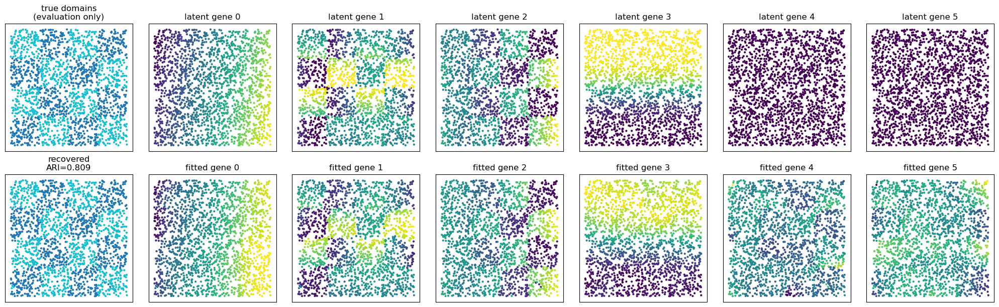

In [10]:
with torch.no_grad():
    random_prediction, random_gates, _ = random_model(random_coords)
    random_labels = random_model.hard_domains(random_coords).cpu().numpy()

initial_ari = adjusted_rand_score(
    random_domains.numpy(), random_initial_domains.numpy()
)
random_ari = adjusted_rand_score(random_domains.numpy(), random_labels)
observed_mse = torch.mean((random_prediction - noisy_expression) ** 2).item()
latent_mse = torch.mean((random_prediction - latent_mean) ** 2).item()
noise_floor = noise_variance.mean().item()
latent_r2 = 1.0 - latent_mse / latent_mean.var(unbiased=False).item()
print(f"boundary-blind initial ARI: {initial_ari:.4f}")
print(f"final domain ARI:           {random_ari:.4f}")
print(f"MSE to noisy samples:       {observed_mse:.4f}")
print(f"MSE to latent functions:    {latent_mse:.4f}")
print(f"mean noise variance:        {noise_floor:.4f}")
print(f"latent-expression R²:       {latent_r2:.4f}")

aligned_random_labels = align_labels(random_labels, random_domains.numpy())
fig, axes = plt.subplots(2, 7, figsize=(20, 6), constrained_layout=True)
axes[0, 0].scatter(random_coords[:, 0], random_coords[:, 1],
                   c=random_domains, cmap="tab10", s=4)
axes[0, 0].set_title("true domains\n(evaluation only)")
axes[1, 0].scatter(random_coords[:, 0], random_coords[:, 1],
                   c=aligned_random_labels, cmap="tab10", s=4)
axes[1, 0].set_title(f"recovered\nARI={random_ari:.3f}")
for gene in range(6):
    axes[0, gene + 1].scatter(
        random_coords[:, 0], random_coords[:, 1], c=latent_mean[:, gene],
        cmap="viridis", s=4
    )
    axes[0, gene + 1].set_title(f"latent gene {gene}")
    axes[1, gene + 1].scatter(
        random_coords[:, 0], random_coords[:, 1], c=random_prediction[:, gene],
        cmap="viridis", s=4
    )
    axes[1, gene + 1].set_title(f"fitted gene {gene}")
for ax in axes.flat:
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

The relevant denoising comparison is the MSE to the unobserved latent functions, not the MSE to noisy samples. Even the true mean has expected MSE equal to the mean noise variance when compared with observations. A noisy-sample MSE near that floor and high latent-expression R² indicate that the model learned spatial behavior rather than memorizing independent noise.

Unlike the earlier tile-aware fit, perfect domain recovery is not expected here: only two of six genes distinguish domains, their variance grows with expression, and points close to boundaries have neighbors from both sides. The reported ARI is therefore an honest measure of boundary discovery. Improving it further should focus on uncertainty-aware graph segmentation or a fully joint initialization—not reintroducing tile coordinates.

## Real cortex slice: 32 PCs, then gene reconstitution

The last experiment uses a MERFISH mouse cortex section (`mouse1_slice212`, ~6,500 cells, 254 genes). Fitting 254 genes directly is unnecessary for domain discovery: most genes are noisy and correlated. The protocol is:

1. \(\log(1+x)\) the gene matrix.
2. Average each cell with its spatial neighbors so PCA sees **spatial expression programs**, not single-cell dropout.
3. Standardize genes and keep the **first 32 principal components** (whitened). Coordinates are not concatenated into the PCA, so the gate still has to infer domains from expression.
4. Fit the same consensus MoE on the 32 PCs, with a slightly richer Fourier expert basis because cortical programs vary faster than the toy fields.
5. Map predicted PCs back to log-gene space and plot markers such as **Cux2** (L2/3), Rorb (L4), Bcl11b (L5) and Foxp2 (L6).

True layer/cell-type labels are used only for comparison plots. Initialization clusters spatially smoothed PCs and does not residualize out laminar trends: in cortex those trends *are* the domains.

cells: 6,469  genes: 254
variance in 32 PCs: 73.0%


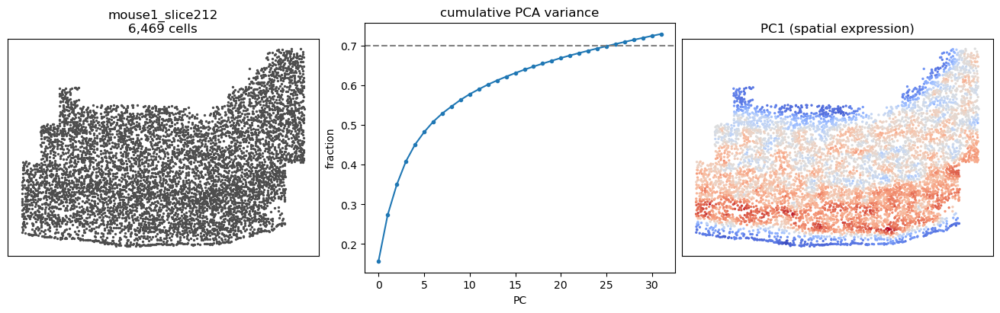

In [11]:
MERFISH_CSV = (
    "/home/asalmona/Documents/Ricci/data/MERFISH_LUNA_small_cortex/"
    "MERFISH_mouse_cortex_train.csv"
)
SECTION = "mouse1_slice212"

coords_raw, gene_expression, gene_names, cell_class = load_merfish_slice(
    MERFISH_CSV, section=SECTION
)
slice_pca = spatial_gene_pca(
    coords_raw,
    gene_expression,
    gene_names,
    n_pcs=32,
    n_neighbors=16,
)

print(f"cells: {coords_raw.shape[0]:,}  genes: {len(gene_names)}")
print(
    "variance in 32 PCs: "
    f"{100 * float(slice_pca.explained_variance_ratio.sum()):.1f}%"
)

fig, axes = plt.subplots(1, 3, figsize=(13, 4), constrained_layout=True)
axes[0].scatter(coords_raw[:, 0], coords_raw[:, 1], s=2, c="0.3")
axes[0].set_title(f"{SECTION}\n{len(coords_raw):,} cells")
axes[1].plot(np.cumsum(slice_pca.explained_variance_ratio), marker="o", ms=3)
axes[1].axhline(0.7, color="0.5", ls="--")
axes[1].set(title="cumulative PCA variance", xlabel="PC", ylabel="fraction")
axes[2].scatter(
    coords_raw[:, 0], coords_raw[:, 1],
    c=slice_pca.pcs[:, 0].numpy(), cmap="coolwarm", s=2
)
axes[2].set_title("PC1 (spatial expression)")
for ax in (axes[0], axes[2]):
    ax.set_aspect("equal")
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

In [13]:
set_seed(7)
N_DOMAINS = 6
slice_edges = spatial_knn_edges(slice_pca.coords, n_neighbors=6)
slice_init = graph_expression_initialization(
    slice_pca.coords,
    slice_pca.pcs,
    n_domains=N_DOMAINS,
    n_neighbors=12,
    seed=7,
    residualize_global_trends=False,
)

slice_model = ConsensusSpatialMoE(
    n_genes=32,
    n_domains=N_DOMAINS,
    rank=8,
    gate_hidden=(64, 64),
    gate_fourier_frequencies=(1, 2, 3),
    basis_config=BasisConfig(frequencies=(0.5, 1.0, 2.0, 4.0)),
)
pretrain_gate(
    slice_model, slice_pca.coords, slice_init, steps=250, learning_rate=1e-2
)
initialize_experts_from_ridge(
    slice_model, slice_pca.coords, slice_pca.pcs, slice_init, ridge=1.0
)

slice_history = fit_consensus_moe(
    slice_model,
    slice_pca.coords,
    slice_pca.pcs,
    epochs=200,
    learning_rate=1e-3,
    gate_learning_rate=2e-4,
    freeze_gate_epochs=80,
    weights=LossWeights(
        spatial_boundary=0.012,
        gate_entropy=0.002,
        gate_balance=0.01,
        coefficient_ridge=1e-4,
        basis_group_lasso=8e-4,
        fused_genes=8e-4,
        boundary_consensus=0.02,
    ),
    edges=slice_edges,
    start_temperature=0.8,
    end_temperature=0.2,
    print_every=50,
)

whitened-PC MSE: 0.636  (each PC has variance 1)
domain sizes: [ 325 1178  640 2603  599 1124]


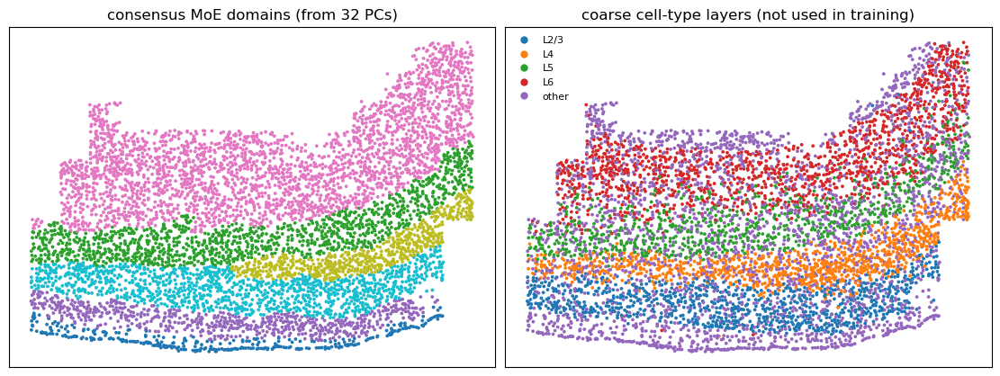

In [14]:
with torch.no_grad():
    slice_pc_pred, _, _ = slice_model(slice_pca.coords)
    slice_domains = slice_model.hard_domains(slice_pca.coords).cpu().numpy()
    reconstructed_log = slice_pca.inverse(slice_pc_pred)

pc_mse = torch.mean((slice_pc_pred - slice_pca.pcs) ** 2).item()
print(f"whitened-PC MSE: {pc_mse:.3f}  (each PC has variance 1)")
print("domain sizes:", np.bincount(slice_domains, minlength=N_DOMAINS))

from matplotlib.lines import Line2D

fig, axes = plt.subplots(1, 2, figsize=(11, 5), constrained_layout=True)
axes[0].scatter(
    coords_raw[:, 0], coords_raw[:, 1], c=slice_domains, cmap="tab10", s=3
)
axes[0].set_title("consensus MoE domains (from 32 PCs)")

layer_order = ["L2/3", "L4", "L5", "L6", "other"]
layer_index = {name: i for i, name in enumerate(layer_order)}
coarse = np.array(
    [
        "L2/3" if "L2/3" in str(label)
        else "L4" if "L4" in str(label)
        else "L5" if "L5" in str(label)
        else "L6" if "L6" in str(label)
        else "other"
        for label in cell_class
    ]
)
layer_codes = np.array([layer_index[name] for name in coarse])
axes[1].scatter(
    coords_raw[:, 0], coords_raw[:, 1],
    c=layer_codes, cmap="tab10", s=3, vmin=0, vmax=9,
)
axes[1].set_title("coarse cell-type layers (not used in training)")
axes[1].legend(
    handles=[
        Line2D(
            [0], [0], marker="o", color="w",
            markerfacecolor=plt.cm.tab10(i / 10), markersize=7, label=name,
        )
        for i, name in enumerate(layer_order)
    ],
    loc="best", fontsize=8, frameon=False,
)
for ax in axes:
    ax.set_aspect("equal")
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

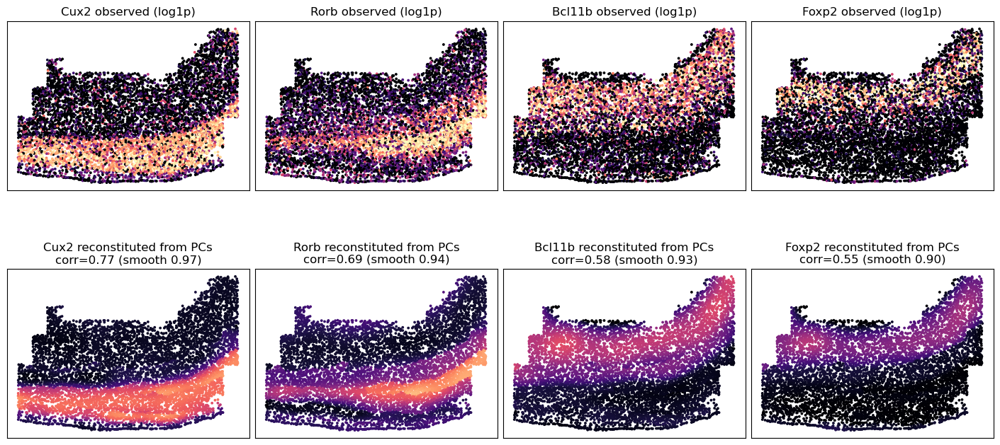

In [15]:
marker_genes = ["Cux2", "Rorb", "Bcl11b", "Foxp2"]
gene_index = {name: i for i, name in enumerate(gene_names)}
observed = slice_pca.log_expression.numpy()
fitted = reconstructed_log.numpy()

fig, axes = plt.subplots(
    2, len(marker_genes), figsize=(14, 7), constrained_layout=True
)
for col, gene in enumerate(marker_genes):
    idx = gene_index[gene]
    raw_corr = np.corrcoef(observed[:, idx], fitted[:, idx])[0, 1]
    smooth_corr = np.corrcoef(
        slice_pca.smoothed_log_expression[:, idx].numpy(), fitted[:, idx]
    )[0, 1]
    vmax = np.quantile(np.concatenate([observed[:, idx], fitted[:, idx]]), 0.99)
    axes[0, col].scatter(
        coords_raw[:, 0], coords_raw[:, 1], c=observed[:, idx],
        cmap="magma", s=3, vmin=0, vmax=vmax,
    )
    axes[0, col].set_title(f"{gene} observed (log1p)")
    axes[1, col].scatter(
        coords_raw[:, 0], coords_raw[:, 1], c=fitted[:, idx],
        cmap="magma", s=3, vmin=0, vmax=vmax,
    )
    axes[1, col].set_title(
        f"{gene} reconstituted from PCs\n"
        f"corr={raw_corr:.2f} (smooth {smooth_corr:.2f})"
    )
for ax in axes.flat:
    ax.set_aspect("equal")
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

The model never sees Cux2 as a named gene during fitting: it predicts 32 spatial PCs, and the gene maps are the inverse PCA of those predictions. Agreement with raw Cux2 is limited by dropout; agreement with neighborhood-smoothed Cux2 is the fairer check that the MoE recovered the laminar program.

Layer ARI versus cell-type annotations is expected to be only moderate. Annotations mix cell identity (IT/ET/CT, Pvalb, glia) with position, while the MoE partitions space by shared changes in spatial expression. The domain map should still be laminar if the consensus-boundary idea is working on cortex.

## another slice tested here 


In [ ]:
SECTION2 = "mouse1_slice283"

coords_raw, gene_expression, gene_names, cell_class = load_merfish_slice(
    MERFISH_CSV, section=SECTION2
)
slice_pca = spatial_gene_pca(
    coords_raw,
    gene_expression,
    gene_names,
    n_pcs=64,
    n_neighbors=16,
)

print(f"cells: {coords_raw.shape[0]:,}  genes: {len(gene_names)}")
print(
    "variance in 64 PCs: "
    f"{100 * float(slice_pca.explained_variance_ratio.sum()):.1f}%"
)

set_seed(7)
N_DOMAINS2 = 8
slice_edges = spatial_knn_edges(slice_pca.coords, n_neighbors=6)
slice_init = graph_expression_initialization(
    slice_pca.coords,
    slice_pca.pcs,
    n_domains=N_DOMAINS2,
    n_neighbors=12,
    seed=7,
    residualize_global_trends=False,
)

slice_model = ConsensusSpatialMoE(
    n_genes=64,
    n_domains=N_DOMAINS2,
    rank=8,
    gate_hidden=(64, 64),
    gate_fourier_frequencies=(1, 2, 3),
    basis_config=BasisConfig(frequencies=(0.5, 1.0, 2.0, 4.0)),
)
pretrain_gate(
    slice_model, slice_pca.coords, slice_init, steps=250, learning_rate=1e-2
)
initialize_experts_from_ridge(
    slice_model, slice_pca.coords, slice_pca.pcs, slice_init, ridge=1.0
)

slice_history = fit_consensus_moe(
    slice_model,
    slice_pca.coords,
    slice_pca.pcs,
    epochs=200,
    learning_rate=1e-3,
    gate_learning_rate=2e-4,
    freeze_gate_epochs=80,
    weights=LossWeights(
        spatial_boundary=0.012,
        gate_entropy=0.002,
        gate_balance=0.01,
        coefficient_ridge=1e-4,
        basis_group_lasso=8e-4,
        fused_genes=8e-4,
        boundary_consensus=0.02,
    ),
    edges=slice_edges,
    start_temperature=0.8,
    end_temperature=0.2,
    print_every=50,
)

with torch.no_grad():
    slice_pc_pred, _, _ = slice_model(slice_pca.coords)
    slice_domains = slice_model.hard_domains(slice_pca.coords).cpu().numpy()
    reconstructed_log = slice_pca.inverse(slice_pc_pred)

pc_mse = torch.mean((slice_pc_pred - slice_pca.pcs) ** 2).item()
print(f"whitened-PC MSE: {pc_mse:.3f}  (each PC has variance 1)")
print("domain sizes:", np.bincount(slice_domains, minlength=N_DOMAINS2))

from matplotlib.lines import Line2D

fig, axes = plt.subplots(1, 2, figsize=(11, 5), constrained_layout=True)
axes[0].scatter(
    coords_raw[:, 0], coords_raw[:, 1], c=slice_domains, cmap="tab10", s=3
)
axes[0].set_title("consensus MoE domains (from 64 PCs)")

layer_order = ["L2/3", "L4", "L5", "L6", "other"]
layer_index = {name: i for i, name in enumerate(layer_order)}
coarse = np.array(
    [
        "L2/3" if "L2/3" in str(label)
        else "L4" if "L4" in str(label)
        else "L5" if "L5" in str(label)
        else "L6" if "L6" in str(label)
        else "other"
        for label in cell_class
    ]
)
layer_codes = np.array([layer_index[name] for name in coarse])
axes[1].scatter(
    coords_raw[:, 0], coords_raw[:, 1],
    c=layer_codes, cmap="tab10", s=3, vmin=0, vmax=9,
)
axes[1].set_title("coarse cell-type layers (not used in training)")
axes[1].legend(
    handles=[
        Line2D(
            [0], [0], marker="o", color="w",
            markerfacecolor=plt.cm.tab10(i / 10), markersize=7, label=name,
        )
        for i, name in enumerate(layer_order)
    ],
    loc="best", fontsize=8, frameon=False,
)
for ax in axes:
    ax.set_aspect("equal")
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

cells: 4,274  genes: 254
variance in 64 PCs: 85.9%


KeyboardInterrupt: 

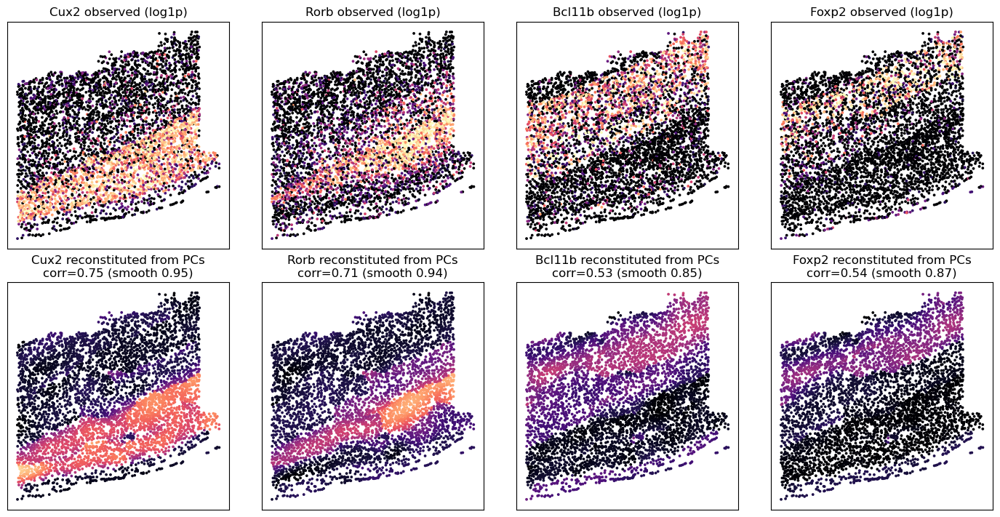

In [ ]:
marker_genes = ["Cux2", "Rorb", "Bcl11b", "Foxp2"]
gene_index = {name: i for i, name in enumerate(gene_names)}
observed = slice_pca.log_expression.numpy()
fitted = reconstructed_log.numpy()

fig, axes = plt.subplots(
    2, len(marker_genes), figsize=(14, 7), constrained_layout=True
)
for col, gene in enumerate(marker_genes):
    idx = gene_index[gene]
    raw_corr = np.corrcoef(observed[:, idx], fitted[:, idx])[0, 1]
    smooth_corr = np.corrcoef(
        slice_pca.smoothed_log_expression[:, idx].numpy(), fitted[:, idx]
    )[0, 1]
    vmax = np.quantile(np.concatenate([observed[:, idx], fitted[:, idx]]), 0.99)
    axes[0, col].scatter(
        coords_raw[:, 0], coords_raw[:, 1], c=observed[:, idx],
        cmap="magma", s=3, vmin=0, vmax=vmax,
    )
    axes[0, col].set_title(f"{gene} observed (log1p)")
    axes[1, col].scatter(
        coords_raw[:, 0], coords_raw[:, 1], c=fitted[:, idx],
        cmap="magma", s=3, vmin=0, vmax=vmax,
    )
    axes[1, col].set_title(
        f"{gene} reconstituted from PCs\n"
        f"corr={raw_corr:.2f} (smooth {smooth_corr:.2f})"
    )
for ax in axes.flat:
    ax.set_aspect("equal")
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

## Compact dictionary with a learned shared frame

The model cannot know how a slice was placed on the slide. It *can* learn two orthonormal tissue axes and then evaluate a small, biologically motivated dictionary in that frame.

Let \(\theta\) be a single angle, shared by every expert, and

\[
\mathbf u(\theta)=(\cos\theta,\sin\theta),\qquad
\mathbf v(\theta)=(-\sin\theta,\cos\theta).
\]

The compact dictionary (13 functions) is

\[
\Phi_\theta(\mathbf s)=\bigl[
1,\;
\mathbf u^\top\mathbf s,\;
\mathbf v^\top\mathbf s,\;
\sigma\{k(\mathbf u^\top\mathbf s-c)\},\;
e^{-\lambda\,\mathrm{softplus}(\pm\mathbf u^\top\mathbf s)},
\text{and the same sigmoid/decay terms along }\mathbf v
\bigr].
\]

No diagonals and no Fourier terms. Linear fields still span the plane for any \(\theta\); sigmoids and decays do not. Group lasso is applied **per family and per axis**, so a gene that is truly a \(u\)-sigmoid is cheaper if \(\theta\) aligns with that axis than if both \(u\) and \(v\) banks stay active.

The gate still sees raw coordinates. Orientation is a property of the *expression dictionary*, not of the partition.

**Why not a different \(\theta_p\) per expert?** Usually that would be overkill, and it would undo part of what this model is for:

- A physical slice has one anatomy. Cortical depth and the along-layer axis are tissue properties, not domain properties. Domains should differ in *which* of those axes a gene uses, and with which intercept/slope/offset, not in the definition of the axes themselves.
- Coefficient fusion and consensus jumps compare \(\theta_{pg}\) to \(\theta_{qg}\) on the *same* basis. If each expert rotates its own frame, a large coefficient difference can mean “the gene changed” or “the coordinate system changed.” Those two explanations are no longer separable.
- Per-expert angles are a soft isodepth: each domain would again be allowed its own 1-D geometry. That is useful only if local anatomy actually rotates from region to region (folded gut, highly anisotropic tumors). Even then a spatially smooth *field* of angles would be more appropriate than \(P\) independent scalars.
- The cheap extension, if a slice really needs it, is a small MLP from coordinates to \(\theta(s)\) with a smoothness penalty — not a free angle per expert.

**Optimization note.** Joint Adam on \((\theta,U,V)\) lets coefficients absorb a wrong frame, so \(\partial\mathcal L/\partial\theta\) vanishes. The envelope gradient is recovered by periodically ridge-refitting the experts at the current \(\theta\) (`refit_experts_every`). That is an EM-style inner step, not a second neural network.

The next section keeps this shared \(\theta\) and allows each domain a shrunk residual \(\delta_p\), so the tissue axis may bend without giving every expert a free rotation.


### Rotated half-plane toy

Spots are sampled in a canonical \((u,v)\) square. Two domains are the half-planes \(u\lessgtr 0\). Structured genes are linear, sigmoidal, or exponentially decaying along those true axes; two genes are spatially constant. Coordinates are then rotated by a known angle and isotropically rescaled. The model sees only the rotated cloud: no axis labels, and initialization does not residualize a global trend because here that trend *is* the domain split.

If the compact dictionary recovers the hidden frame, the learned axes should match the true pair up to sign and axis swap (error in \([0,\pi/4]\)).


compact dictionary: BasisConfig(sigmoid_slopes=(6.0,), sigmoid_offsets=(-0.4, 0.0, 0.4), exp_rates=(2.0,), frequencies=(), include_diagonals=False)
n_basis: 13
true angle: 34.4 deg


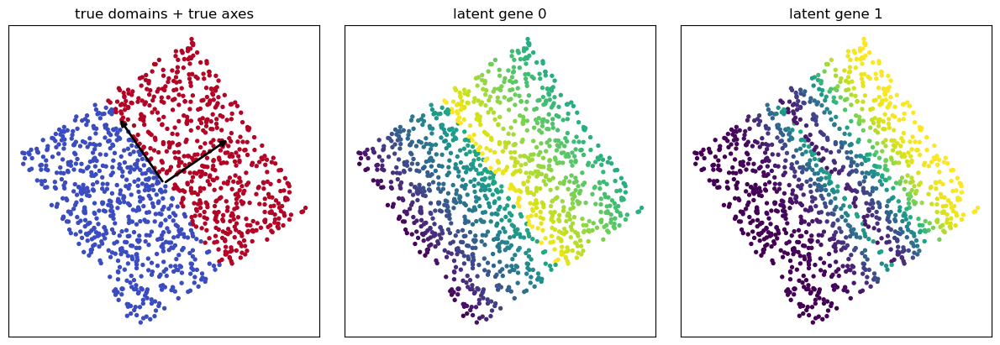

In [6]:
import math

TRUE_ANGLE = 0.6
axis_coords, axis_expression, axis_domains, axis_latent, axis_variance, true_angle = (
    make_oriented_axis_toy(n_spots=1200, angle=TRUE_ANGLE, seed=11)
)
print("compact dictionary:", compact_basis_config())
print("n_basis:", ConsensusSpatialMoE(1, 1, learned_axes=True, basis_config=compact_basis_config()).basis.n_basis)
print(f"true angle: {math.degrees(true_angle):.1f} deg")

def draw_axes(ax, directions, origin=(0.0, 0.0), scale=0.55, color="k", label=None):
    origin = np.asarray(origin, dtype=float)
    dirs = np.asarray(directions, dtype=float)
    for i, vector in enumerate(dirs[:2]):
        ax.annotate(
            "",
            xy=origin + scale * vector,
            xytext=origin,
            arrowprops=dict(arrowstyle="-|>", color=color, lw=2),
        )
    if label:
        ax.plot([], [], color=color, lw=2, label=label)

true_u = np.array([math.cos(true_angle), math.sin(true_angle)])
true_v = np.array([-math.sin(true_angle), math.cos(true_angle)])

fig, axes = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True)
axes[0].scatter(axis_coords[:, 0], axis_coords[:, 1], c=axis_domains, cmap="coolwarm", s=8)
draw_axes(axes[0], np.stack([true_u, true_v]), color="k")
axes[0].set_title("true domains + true axes")
for gene, ax in enumerate(axes[1:]):
    ax.scatter(
        axis_coords[:, 0], axis_coords[:, 1],
        c=axis_latent[:, gene].numpy(), cmap="viridis", s=8,
    )
    ax.set_title(f"latent gene {gene}")
for ax in axes:
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()


In [7]:
set_seed(11)
axis_edges = spatial_knn_edges(axis_coords, n_neighbors=6)
axis_init = graph_expression_initialization(
    axis_coords,
    axis_expression,
    n_domains=2,
    n_neighbors=8,
    seed=11,
    residualize_global_trends=False,
)

axis_model = ConsensusSpatialMoE(
    n_genes=axis_expression.shape[1],
    n_domains=2,
    rank=4,
    gate_hidden=(64, 64),
    gate_fourier_frequencies=(1, 2, 3),
    basis_config=compact_basis_config(),
    learned_axes=True,
)
# Square clouds have no unique coordinate PCA; start at 0 and learn from expression.
pretrain_gate(axis_model, axis_coords, axis_init, steps=250, learning_rate=1e-2)
initialize_experts_from_ridge(
    axis_model,
    axis_coords,
    axis_expression,
    axis_init,
    observation_variance=axis_variance,
    ridge=0.3,
)

axis_history = fit_consensus_moe(
    axis_model,
    axis_coords,
    axis_expression,
    epochs=250,
    learning_rate=1e-3,
    gate_learning_rate=3e-4,
    axis_learning_rate=5e-2,
    freeze_gate_epochs=40,
    freeze_axes_epochs=0,
    refit_experts_every=1,
    refit_ridge=0.3,
    weights=LossWeights(
        spatial_boundary=0.004,
        gate_entropy=0.002,
        gate_balance=0.01,
        coefficient_ridge=1e-4,
        basis_group_lasso=3e-3,
        fused_genes=1e-3,
        boundary_consensus=0.03,
    ),
    observation_variance=axis_variance,
    edges=axis_edges,
    start_temperature=0.8,
    end_temperature=0.15,
    print_every=50,
)


fit_consensus_moe: 100%|██████████| 250/250 [00:04<00:00, 50.84it/s, loss=1.132, recon=1.118, temp=0.15]


init ARI: 0.846   final ARI: 0.934
learned angle: 36.7 deg   axis-pair error: 2.3 deg
latent R2: 0.944
dictionary: ['constant', 'linear:u', 'linear:v', 'sigmoid:u:k=6:c=-0.4', 'sigmoid:u:k=6:c=0', 'sigmoid:u:k=6:c=0.4', 'exp_decay:+u:lambda=2', 'exp_decay:-u:lambda=2', 'sigmoid:v:k=6:c=-0.4', 'sigmoid:v:k=6:c=0', 'sigmoid:v:k=6:c=0.4', 'exp_decay:+v:lambda=2', 'exp_decay:-v:lambda=2']


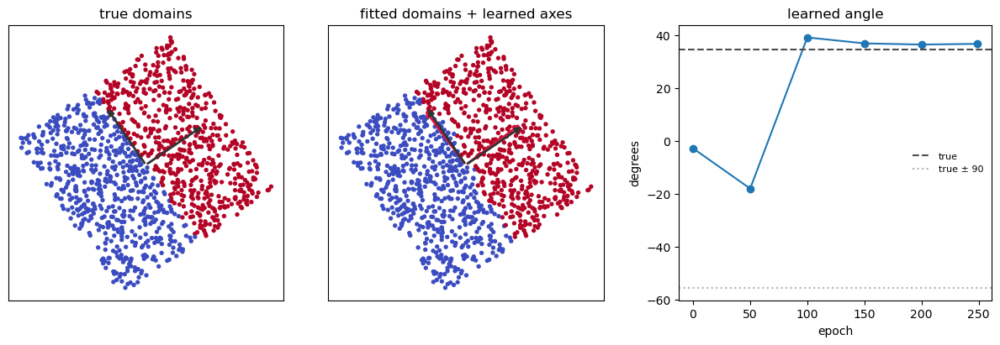

In [8]:
with torch.no_grad():
    axis_pred, _, _ = axis_model(axis_coords)
    axis_labels = axis_model.hard_domains(axis_coords).cpu().numpy()
    learned_dirs = axis_model.axis_directions().cpu().numpy()

init_ari = adjusted_rand_score(axis_domains.numpy(), axis_init.numpy())
final_ari = adjusted_rand_score(axis_domains.numpy(), axis_labels)
angle_error = math.degrees(axis_pair_error(axis_model.axis_angle, true_angle))
latent_r2 = 1.0 - float(
    ((axis_pred - axis_latent) ** 2).mean()
    / ((axis_latent - axis_latent.mean()) ** 2).mean()
)
print(f"init ARI: {init_ari:.3f}   final ARI: {final_ari:.3f}")
print(
    f"learned angle: {math.degrees(float(axis_model.axis_angle)):.1f} deg   "
    f"axis-pair error: {angle_error:.1f} deg"
)
print(f"latent R2: {latent_r2:.3f}")
print("dictionary:", axis_model.basis.names)

fig, axes = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True)
axes[0].scatter(axis_coords[:, 0], axis_coords[:, 1], c=axis_domains, cmap="coolwarm", s=8)
draw_axes(axes[0], np.stack([true_u, true_v]), color="0.2", label="true")
axes[0].set_title("true domains")
axes[1].scatter(axis_coords[:, 0], axis_coords[:, 1], c=axis_labels, cmap="coolwarm", s=8)
draw_axes(axes[1], learned_dirs, color="crimson", label="learned")
draw_axes(axes[1], np.stack([true_u, true_v]), color="0.2")
axes[1].set_title("fitted domains + learned axes")
axes[2].plot(
    [row["epoch"] for row in axis_history],
    [math.degrees(row["axis_angle"]) for row in axis_history],
    marker="o",
)
axes[2].axhline(math.degrees(true_angle), color="0.3", ls="--", label="true")
axes[2].axhline(math.degrees(true_angle) - 90, color="0.7", ls=":", label="true ± 90")
axes[2].set(title="learned angle", xlabel="epoch", ylabel="degrees")
axes[2].legend(frameon=False, fontsize=8)
for ax in axes[:2]:
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()


### Cortex slice with the same compact frame

Reload `mouse1_slice212` so this cell does not depend on the previous 64-PC experiment. Fit 6 domains on 32 PCs with the 13-function dictionary and one shared angle. The point cloud is elongated, so the angle is initialized from coordinate PCA and then refined from expression. Marker genes are reconstituted by inverse PCA, as before.


mouse1_slice212: 6,469 cells, 73.0% variance in 32 PCs
compact n_basis: 13
coordinate-PCA angle: 153.1 deg


fit_consensus_moe: 100%|██████████| 300/300 [01:09<00:00,  4.29it/s, loss=0.661, recon=0.652, temp=0.20]


whitened-PC MSE: 0.652
domain sizes: [ 303 1238  652 2580  597 1099]
learned angle: 145.8 deg


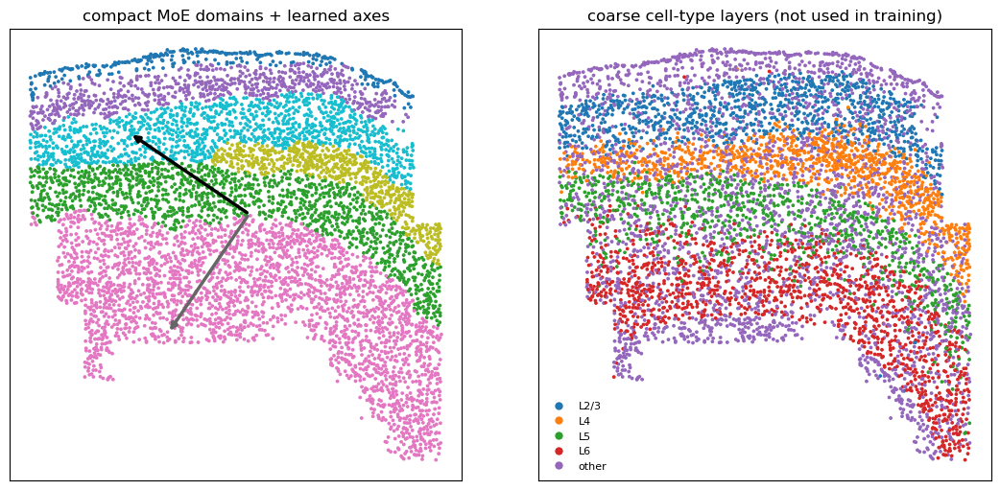

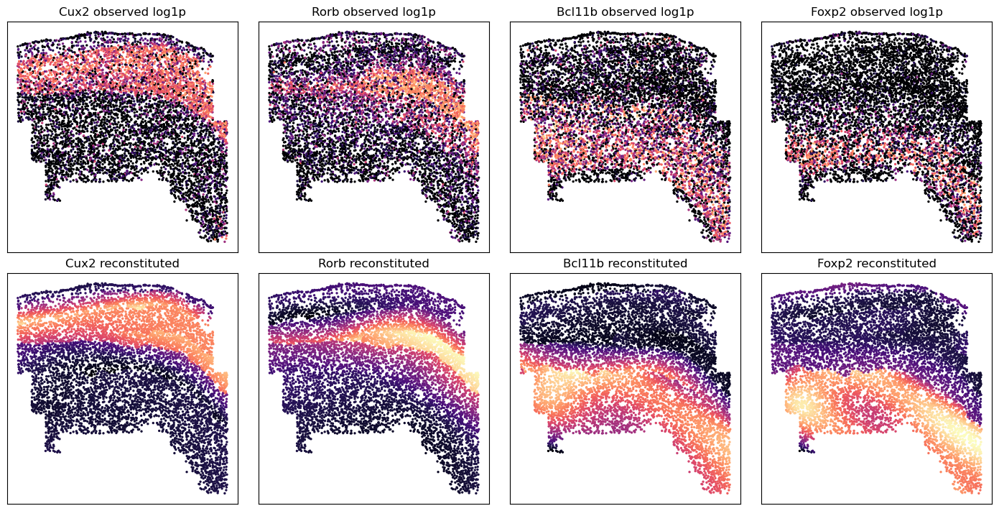

In [9]:
import math
from matplotlib.lines import Line2D

MERFISH_CSV = (
    "/home/asalmona/Documents/Ricci/data/MERFISH_LUNA_small_cortex/"
    "MERFISH_mouse_cortex_train.csv"
)
SECTION_AXES = "mouse1_slice212"

coords_raw_ax, gene_expression_ax, gene_names_ax, cell_class_ax = load_merfish_slice(
    MERFISH_CSV, section=SECTION_AXES
)
slice_pca_ax = spatial_gene_pca(
    coords_raw_ax,
    gene_expression_ax,
    gene_names_ax,
    n_pcs=32,
    n_neighbors=16,
)
print(
    f"{SECTION_AXES}: {coords_raw_ax.shape[0]:,} cells, "
    f"{100 * float(slice_pca_ax.explained_variance_ratio.sum()):.1f}% variance in 32 PCs"
)
print("compact n_basis:", ConsensusSpatialMoE(
    1, 1, learned_axes=True, basis_config=compact_basis_config()
).basis.n_basis)

set_seed(7)
N_DOMAINS_AX = 6
slice_edges_ax = spatial_knn_edges(slice_pca_ax.coords, n_neighbors=6)
slice_init_ax = graph_expression_initialization(
    slice_pca_ax.coords,
    slice_pca_ax.pcs,
    n_domains=N_DOMAINS_AX,
    n_neighbors=12,
    seed=7,
    residualize_global_trends=False,
)

compact_model = ConsensusSpatialMoE(
    n_genes=32,
    n_domains=N_DOMAINS_AX,
    rank=8,
    gate_hidden=(64, 64),
    gate_fourier_frequencies=(1, 2, 3),
    basis_config=compact_basis_config(),
    learned_axes=True,
)
init_learned_axes_from_coords(compact_model, slice_pca_ax.coords)
print(f"coordinate-PCA angle: {math.degrees(float(compact_model.axis_angle)):.1f} deg")

pretrain_gate(compact_model, slice_pca_ax.coords, slice_init_ax, steps=250, learning_rate=1e-2)
initialize_experts_from_ridge(
    compact_model, slice_pca_ax.coords, slice_pca_ax.pcs, slice_init_ax, ridge=1.0
)

compact_history = fit_consensus_moe(
    compact_model,
    slice_pca_ax.coords,
    slice_pca_ax.pcs,
    epochs=300,
    learning_rate=1e-3,
    gate_learning_rate=2e-4,
    axis_learning_rate=3e-2,
    freeze_gate_epochs=80,
    freeze_axes_epochs=0,
    refit_experts_every=5,
    refit_ridge=1.0,
    weights=LossWeights(
        spatial_boundary=0.012,
        gate_entropy=0.002,
        gate_balance=0.01,
        coefficient_ridge=1e-4,
        basis_group_lasso=8e-4,
        fused_genes=8e-4,
        boundary_consensus=0.02,
    ),
    edges=slice_edges_ax,
    start_temperature=0.8,
    end_temperature=0.2,
    print_every=50,
)

with torch.no_grad():
    compact_pc_pred, _, _ = compact_model(slice_pca_ax.coords)
    compact_domains = compact_model.hard_domains(slice_pca_ax.coords).cpu().numpy()
    compact_log = slice_pca_ax.inverse(compact_pc_pred)
    compact_dirs = compact_model.axis_directions().cpu().numpy()

pc_mse = torch.mean((compact_pc_pred - slice_pca_ax.pcs) ** 2).item()
print(f"whitened-PC MSE: {pc_mse:.3f}")
print("domain sizes:", np.bincount(compact_domains, minlength=N_DOMAINS_AX))
print(f"learned angle: {math.degrees(float(compact_model.axis_angle)):.1f} deg")

origin = slice_pca_ax.coords.mean(dim=0).numpy()
fig, axes = plt.subplots(1, 2, figsize=(11, 5), constrained_layout=True)
axes[0].scatter(
    slice_pca_ax.coords[:, 0], slice_pca_ax.coords[:, 1],
    c=compact_domains, cmap="tab10", s=3,
)
for vector, color in zip(compact_dirs, ("k", "0.4")):
    axes[0].annotate(
        "",
        xy=origin + 0.7 * vector,
        xytext=origin,
        arrowprops=dict(arrowstyle="-|>", color=color, lw=2.5),
    )
axes[0].set_title("compact MoE domains + learned axes")

layer_order = ["L2/3", "L4", "L5", "L6", "other"]
layer_index = {name: i for i, name in enumerate(layer_order)}
coarse = np.array(
    [
        "L2/3" if "L2/3" in str(label)
        else "L4" if "L4" in str(label)
        else "L5" if "L5" in str(label)
        else "L6" if "L6" in str(label)
        else "other"
        for label in cell_class_ax
    ]
)
layer_codes = np.array([layer_index[name] for name in coarse])
axes[1].scatter(
    slice_pca_ax.coords[:, 0], slice_pca_ax.coords[:, 1],
    c=layer_codes, cmap="tab10", s=3, vmin=0, vmax=9,
)
axes[1].set_title("coarse cell-type layers (not used in training)")
axes[1].legend(
    handles=[
        Line2D(
            [0], [0], marker="o", color="w",
            markerfacecolor=plt.cm.tab10(i / 10), markersize=7, label=name,
        )
        for i, name in enumerate(layer_order)
    ],
    loc="best", fontsize=8, frameon=False,
)
for ax in axes:
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

marker_genes = ["Cux2", "Rorb", "Bcl11b", "Foxp2"]
gene_index = {name: i for i, name in enumerate(gene_names_ax)}
observed = slice_pca_ax.log_expression.numpy()
fitted = compact_log.numpy()
fig, axes = plt.subplots(2, 4, figsize=(14, 7), constrained_layout=True)
for col, name in enumerate(marker_genes):
    idx = gene_index[name]
    axes[0, col].scatter(
        slice_pca_ax.coords[:, 0], slice_pca_ax.coords[:, 1],
        c=observed[:, idx], cmap="magma", s=2,
    )
    axes[0, col].set_title(f"{name} observed log1p")
    axes[1, col].scatter(
        slice_pca_ax.coords[:, 0], slice_pca_ax.coords[:, 1],
        c=fitted[:, idx], cmap="magma", s=2,
    )
    axes[1, col].set_title(f"{name} reconstituted")
for ax in axes.ravel():
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()


## more difficult test : ABC subsampled slices

In [2]:
# MERFISH ABC subsampled slices
import pandas as pd

MERFISH_ABC_CSV = (
    "/home/asalmona/Documents/Ricci/data/MERFISH_ABC/MOUSE_ABC1/"
    "MOUSE_ABC1_sliced_subsampled.csv"
)

# Load the first few rows of the data
df_head = pd.read_csv(MERFISH_ABC_CSV, nrows=5)
print("Dataframe head:")
print(df_head)

# Only load the 'cell_section' column for unique section discovery to save RAM
df_sections = pd.read_csv(MERFISH_ABC_CSV, usecols=['cell_section'])
sections_list = df_sections['cell_section'].unique().tolist()
print("Unique cell_section values:")
print(sections_list)



Dataframe head:
                                cell_label  coord_X  coord_Y     cell_class  \
0  286759255226145810956026054930906113758  6.49542  3.71385     28 CB GABA   
1  182970830750483462624265172212377118152  5.60146  4.35312   31 OPC-Oligo   
2  128469804699753940792644109324770792780  6.81393  4.81139     24 MY Glut   
3  266730051990962487488522389747436409199  4.22248  4.38948  30 Astro-Epen   
4  205357412474478960240329641532023555106  4.78342  3.50960  30 Astro-Epen   

        cell_section  spatial_module_l1_complete  Anatomical Division  \
0  Zhuang-ABCA-1.150                         NaN                  NaN   
1  Zhuang-ABCA-1.150                         NaN                  NaN   
2  Zhuang-ABCA-1.150                         NaN                  NaN   
3  Zhuang-ABCA-1.150                         NaN                  NaN   
4  Zhuang-ABCA-1.150                         NaN                  NaN   

   Anatomical Structure  Anatomical Substructure  ENSMUSG00000024798  

/home/asalmona/Documents/Ricci/code/GASTON-Mix/gaston_improvement_support.py:1318: DtypeWarning: Columns (5,6,7,8) have mixed types. Specify dtype option on import or set low_memory=False.
  table = pd.read_csv(csv_path)


cells: 8,000  genes: 1123
variance in 32 PCs: 82.9%


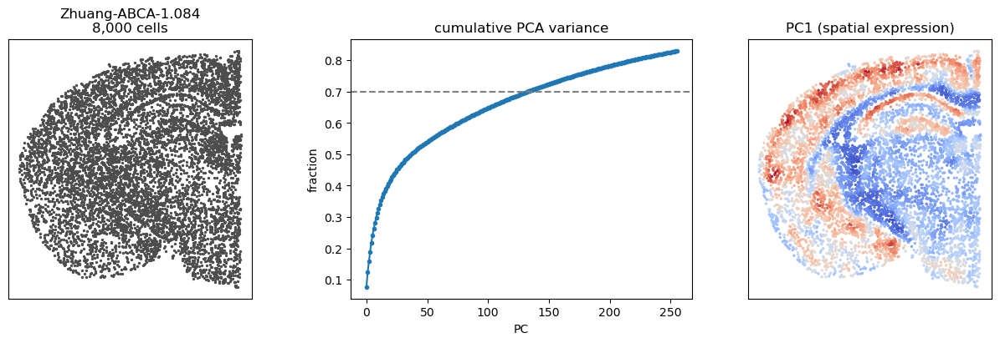

In [5]:
SECTION_ABC = "Zhuang-ABCA-1.084"
dataset = "MERFISH_ABC"

coords_raw_abc, gene_expression_abc, gene_names_abc, cell_class_abc = load_merfish_slice(
    MERFISH_ABC_CSV, section=SECTION_ABC, dataset=dataset
)
slice_pca_abc = spatial_gene_pca(
    coords_raw_abc,
    gene_expression_abc,
    gene_names_abc,
    n_pcs=256,
    n_neighbors=16,
)

print(f"cells: {coords_raw_abc.shape[0]:,}  genes: {len(gene_names_abc)}")
print(
    "variance in 32 PCs: "
    f"{100 * float(slice_pca_abc.explained_variance_ratio.sum()):.1f}%"
)

fig, axes = plt.subplots(1, 3, figsize=(13, 4), constrained_layout=True)
axes[0].scatter(coords_raw_abc[:, 0], coords_raw_abc[:, 1], s=2, c="0.3")
axes[0].set_title(f"{SECTION_ABC}\n{len(coords_raw_abc):,} cells")
axes[1].plot(np.cumsum(slice_pca_abc.explained_variance_ratio), marker="o", ms=3)
axes[1].axhline(0.7, color="0.5", ls="--")
axes[1].set(title="cumulative PCA variance", xlabel="PC", ylabel="fraction")
axes[2].scatter(
    coords_raw_abc[:, 0], coords_raw_abc[:, 1],
    c=slice_pca_abc.pcs[:, 0].numpy(), cmap="coolwarm", s=2
)
axes[2].set_title("PC1 (spatial expression)")
for ax in (axes[0], axes[2]):
    ax.set_aspect("equal")
    ax.invert_yaxis()
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

In [ ]:
N_DOMAINS_ABC = 20
slice_edges_abc = spatial_knn_edges(slice_pca_abc.coords, n_neighbors=6)
slice_init_abc = graph_expression_initialization(
    slice_pca_abc.coords,
    slice_pca_abc.pcs,
    n_domains=N_DOMAINS_ABC,
    n_neighbors=12,
    seed=7,
    residualize_global_trends=False,
)

compact_model_abc = ConsensusSpatialMoE(
    n_genes=256,
    n_domains=N_DOMAINS_ABC,
    rank=8,
    gate_hidden=(64, 64),
    gate_fourier_frequencies=(1, 2, 3),
    basis_config=compact_basis_config(),
    learned_axes=True,
)
init_learned_axes_from_coords(compact_model_abc, slice_pca_abc.coords)
print(f"coordinate-PCA angle: {math.degrees(float(compact_model_abc.axis_angle)):.1f} deg")

pretrain_gate(compact_model_abc, slice_pca_abc.coords, slice_init_abc, steps=250, learning_rate=1e-2)
initialize_experts_from_ridge(
    compact_model_abc, slice_pca_abc.coords, slice_pca_abc.pcs, slice_init_abc, ridge=1.0
)

compact_history_abc = fit_consensus_moe(
    compact_model_abc,
    slice_pca_abc.coords,
    slice_pca_abc.pcs,
    epochs=300,
    learning_rate=1e-3,
    gate_learning_rate=2e-4,
    axis_learning_rate=3e-2,
    freeze_gate_epochs=80,
    freeze_axes_epochs=0,
    refit_experts_every=5,
    refit_ridge=1.0,
    weights=LossWeights(
        spatial_boundary=0.012,
        gate_entropy=0.002,
        gate_balance=0.01,
        coefficient_ridge=1e-4,
        basis_group_lasso=8e-4,
        fused_genes=8e-4,
        boundary_consensus=0.02,
    ),
    edges=slice_edges_abc,
    start_temperature=0.8,
    end_temperature=0.2,
    print_every=50,
)

with torch.no_grad():
    compact_pc_pred_abc, _, _ = compact_model_abc(slice_pca_abc.coords)
    compact_domains_abc = compact_model_abc.hard_domains(slice_pca_abc.coords).cpu().numpy()
    compact_log_abc = slice_pca_abc.inverse(compact_pc_pred_abc)
    compact_dirs_abc = compact_model_abc.axis_directions().cpu().numpy()

pc_mse_abc = torch.mean((compact_pc_pred_abc - slice_pca_abc.pcs) ** 2).item()
print(f"whitened-PC MSE: {pc_mse_abc:.3f}")
print("domain sizes:", np.bincount(compact_domains_abc, minlength=N_DOMAINS_ABC))
print(f"learned angle: {math.degrees(float(compact_model_abc.axis_angle)):.1f} deg")

origin_abc = slice_pca_abc.coords.mean(dim=0).numpy()
fig, axes = plt.subplots(1, 2, figsize=(11, 5), constrained_layout=True)
axes[0].scatter(
    slice_pca_abc.coords[:, 0], slice_pca_abc.coords[:, 1],
    c=compact_domains_abc, cmap="tab10", s=3,
)
for vector, color in zip(compact_dirs_abc, ("k", "0.4")):
    axes[0].annotate(
        "",
        xy=origin_abc + 0.7 * vector,
        xytext=origin_abc,
        arrowprops=dict(arrowstyle="-|>", color=color, lw=2.5),
    )
axes[0].set_title("compact MoE domains + learned axes")

layer_order = ["L2/3", "L4", "L5", "L6", "other"]
layer_index = {name: i for i, name in enumerate(layer_order)}
coarse_abc = np.array(
    [
        "L2/3" if "L2/3" in str(label)
        else "L4" if "L4" in str(label)
        else "L5" if "L5" in str(label)
        else "L6" if "L6" in str(label)
        else "other"
        for label in cell_class_abc
    ]
)
layer_codes_abc = np.array([layer_index[name] for name in coarse_abc])
axes[1].scatter(
    slice_pca_abc.coords[:, 0], slice_pca_abc.coords[:, 1],
    c=layer_codes_abc, cmap="tab10", s=3, vmin=0, vmax=9,
)
axes[1].set_title("coarse cell-type layers (not used in training)")
axes[1].legend(
    handles=[
        Line2D(
            [0], [0], marker="o", color="w",
            markerfacecolor=plt.cm.tab10(i / 10), markersize=7, label=name,
        )
        for i, name in enumerate(layer_order)
    ],
    loc="best", fontsize=8, frameon=False,
)
for ax in axes:
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

'''marker_genes = ["Cux2", "Rorb", "Bcl11b", "Foxp2"]
gene_index_abc = {name: i for i, name in enumerate(gene_names_abc)}
observed_abc = slice_pca_abc.log_expression.numpy()
fitted_abc = compact_log_abc.numpy()
fig, axes = plt.subplots(2, 4, figsize=(14, 7), constrained_layout=True)
for col, name in enumerate(marker_genes):
    idx = gene_index_abc[name]
    axes[0, col].scatter(
        slice_pca_abc.coords[:, 0], slice_pca_abc.coords[:, 1],
        c=observed_abc[:, idx], cmap="magma", s=2,
    )
    axes[0, col].set_title(f"{name} observed log1p")
    axes[1, col].scatter(
        slice_pca_abc.coords[:, 0], slice_pca_abc.coords[:, 1],
        c=fitted_abc[:, idx], cmap="magma", s=2,
    )
    axes[1, col].set_title(f"{name} reconstituted")
for ax in axes.ravel():
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()'''

coordinate-PCA angle: 154.4 deg


fit_consensus_moe:   0%|          | 0/300 [00:00<?, ?it/s]